In [1]:
import numpy as np
import pandas as pd
import vectorbt as vbt
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas_ta as ta
import yfinance as yf 
import warnings
import plotly.graph_objects as go
from plotly.subplots import make_subplots
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
%matplotlib inline

##### Full Data

In [2]:
# BTC Full
btc = pd.read_csv('2022.2.9BTCUSDT-H1-NoSession.csv')
btc.Date = btc.Date.astype(str)+' '+ btc.Time
btc.Date = pd.to_datetime(btc.Date)
btc.drop(columns= ['Time'], inplace = True)
btc = btc.set_index('Date')

In [3]:
btc = btc.loc['2021-01-01 08:00:00':]

In [4]:
# EURUSD Full
df = pd.read_csv('2022.2.9EURUSD-H4-NoSession.csv')
df.Date = df.Date.astype(str)+' '+ df.Time
df.Date = pd.to_datetime(df.Date)
df.drop(columns= ['Time'], inplace = True)
df = df.set_index('Date')

##### Trend, Non-Trend Data

In [5]:
dftr1 = pd.read_csv('TRE_EURUSD_2011_2015.csv', index_col = 'Date')
dftr2 = pd.read_csv('TRE_EURUSD_2017_2018.csv', index_col = 'Date')
# ------------------------------------------------------------------
dfsw1 = pd.read_csv('SW_EURUSD_2015_2017_4H.csv', index_col = 'Date')
dfsw2 = pd.read_csv('SW_EURUSD_2010_2014_4H.csv', index_col = 'Date')

##### Util Function

In [6]:
#initial
def set_up_df(df:pd.DataFrame , index):  
    df1    =   pd.DataFrame(columns=index)
    df1['date']  =    df.index 
    df1.date = pd.to_datetime(df1.date,format='%Y-%m-%d')
    df1 = df1.set_index('date')
    return df1

#for calculate duration
def convert_to_hours(delta):
    total_seconds = delta.total_seconds()
    hours = str(int(total_seconds // 3600))
    return hours

#Performance Matric
def cal_consecutive(df:pd.DataFrame):
    df['win']= np.sign(df) # assign sign on log
    blocks = df['win'].ne(df['win'].shift()).cumsum() 
    df['consecutive_WL'] = df['win'].groupby(blocks).cumsum()
    return df['consecutive_WL'] 

def Cal_portstat(port):
    port_return = port.total_return().to_frame()
    port_return['MaxDD'] = port.max_drawdown()
    port_return['NumTrade'] = port.trades.count()
    port_return['WinRate'] = port.trades.win_rate()
    port_return['AvgWinningTrade'] = port.trades.winning.returns.mean()
    port_return['AvgLosingTrade'] = port.trades.losing.returns.mean()
    port_return['SharpRatio'] = port.returns_acc.sharpe_ratio()
    return port_return

def Cal_pip(df):
    pip = []
    pipp = df['Avg Exit Price'] - df['Avg Entry Price']
    for i in portfinal['Direction']:
        if i == 'Long':
            pip.append(1)
        else :
            pip.append(-1)    
    return (pip * pipp) 

def Cal_mae_mfe(data,port):
    MAE = []
    MFE = []
    for i,j,y,k in zip(port['Entry Timestamp'], port['Exit Timestamp'], port['Avg Entry Price'], port['Direction']):
        if k == 'Long':
            MFE.append((data.loc[i:j]['High'].max() - y)/y)
            MAE.append((y - df.loc[i:j]['Low'].min())/y)
        else :
            MAE.append((data.loc[i:j]['High'].max() - y)/y)
            MFE.append((y - df.loc[i:j]['Low'].min())/y)
    return MAE, MFE  

def Calkelly(port):
    init_cash = 10000
    W = port.stats()[15]/100
    A = abs(port.stats()[19])
    B = port.stats()[18]
    Percent_kelly = (W/A) - ((1-W)/B)
    riskpertrade = Percent_kelly * init_cash
    print(f'Percent_kelly = {Percent_kelly}')

def Cal_EWMvolatile(df, period = 100):
    df['logreturns'] = np.log(df.Close/df.Close.shift(1))
    df['vol'] = df['logreturns'].rolling(period).std()*252**.5
    df['ewmvol'] = df['vol'].ewm(alpha=0.96).mean()
    return df['ewmvol']    

##### Default Parameter Strategy

In [7]:
def default_strategy(df, timeframe = '1h', cash = 10000):
    e1 = df.ta.ema(12)
    e2 = df.ta.ema(26)
    ckpl = df.ta.cksp()['CKSPl_10_3_20']
    ckps = df.ta.cksp()['CKSPs_10_3_20']
    
    l1 = (e1 > e2) & (e1.shift(1) < e2) 
    l2 = (df.Close > e1)
    long_signal = l1 & l2

    s1 = (e1 < e2) & (e1.shift(1) > e2)
    s2 = (df.Close < e1)
    short_signal = s1 & s2 

    long_exit =  (df.Close < ckpl)
    short_exit =  (df.Close > ckpl)

    #add to Empty Dataframe
    LongEntries = long_signal
    LongExit= long_exit    
    ShortEntries= short_signal
    ShortExit= short_exit

    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = LongEntries,
                                    exits = LongExit,
                                    short_entries = ShortEntries,
                                    short_exits = ShortExit,
                                    freq = timeframe,
                                    init_cash = cash,
                                    fees = 0.00,
                                    slippage = 0.00)
    return port

In [8]:
default_strategy(btc).stats()

Start                               2021-01-01 08:00:00
End                                 2022-02-03 00:00:00
Period                                397 days 04:00:00
Start Value                                     10000.0
End Value                                  13367.977467
Total Return [%]                              33.679775
Benchmark Return [%]                          27.166818
Max Gross Exposure [%]                            100.0
Total Fees Paid                                     0.0
Max Drawdown [%]                              36.624184
Max Drawdown Duration                 110 days 04:00:00
Total Trades                                        316
Total Closed Trades                                 315
Total Open Trades                                     1
Open Trade PnL                               286.355175
Win Rate [%]                                  32.063492
Best Trade [%]                                16.225966
Worst Trade [%]                              -10

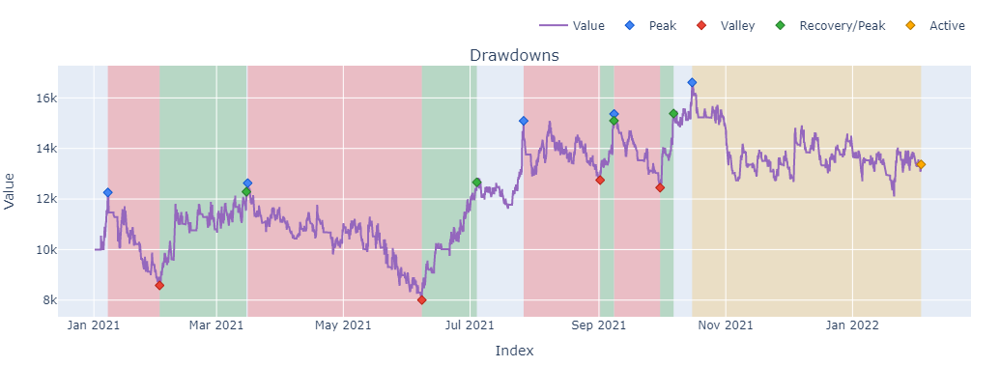

In [9]:
default_strategy(btc).plot(subplots=['drawdowns']).show() # Equity Curve

----------------------------------------

##### Optimise ATR Multiply
##### Strategy with Volatility SL

In [10]:
def default_strategy_sl(df, timeframe = '1h', cash = 10000, multiply = 1):
    e1 = df.ta.ema(12)
    e2 = df.ta.ema(26)
    ckpl = df.ta.cksp()['CKSPl_10_3_20']
    ckps = df.ta.cksp()['CKSPs_10_3_20']
    
    l1 = (e1 > e2) & (e1.shift(1) < e2) 
    l2 = (df.Close > e1)
    long_signal = l1 & l2

    s1 = (e1 < e2) & (e1.shift(1) > e2)
    s2 = (df.Close < e1)
    short_signal = s1 & s2 

    long_exit =  (df.Close < ckpl)
    short_exit =  (df.Close > ckpl)

    #add to Empty Dataframe
    LongEntries = long_signal
    LongExit= long_exit    
    ShortEntries= short_signal
    ShortExit= short_exit
    
    df['atr'] = df.ta.atr()
    df['sl_stop'] = (df['atr'] * multiply) / df.Close
    
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = LongEntries,
                                    exits = LongExit,
                                    short_entries = ShortEntries,
                                    short_exits = ShortExit,
                                    freq = timeframe,
                                    init_cash = cash,
                                    fees = 0.00, sl_stop = df['sl_stop'],
                                    slippage = 0.00)
    return port

portstats = []
start, end, step = (1, 4, 0.1)
array = np.arange(start,end,step)
for i in array:
    port = default_strategy_sl(btc, multiply = i)
    portstats.append(port.stats())
pd.DataFrame(portstats).sort_values('Sharpe Ratio',ascending=False).head(5)     # Sort for best param

,Start,End,Period,Start Value,End Value,Total Return [%],Benchmark Return [%],Max Gross Exposure [%],Total Fees Paid,Max Drawdown [%],...,Avg Winning Trade [%],Avg Losing Trade [%],Avg Winning Trade Duration,Avg Losing Trade Duration,Profit Factor,Expectancy,Sharpe Ratio,Calmar Ratio,Omega Ratio,Sortino Ratio
4,2021-01-01 08:00:00,2022-02-03,397 days 04:00:00,10000.0,16986.402470,69.864025,27.166818,100.0,0.0,29.029231,...,3.818045,-1.506197,1 days 13:25:48,0 days 10:35:28.846153846,1.155467,21.882478,1.105139,2.160897,1.045173,1.689301
5,2021-01-01 08:00:00,2022-02-03,397 days 04:00:00,10000.0,16900.488749,69.004887,27.166818,100.0,0.0,30.446543,...,3.853501,-1.521208,1 days 13:34:32.727272727,0 days 10:55:20.388349514,1.148420,21.820120,1.094882,2.035457,1.044684,1.671973
2,2021-01-01 08:00:00,2022-02-03,397 days 04:00:00,10000.0,16514.178383,65.141784,27.166818,100.0,0.0,27.971273,...,3.799219,-1.442370,1 days 13:09:35.999999999,0 days 09:29:26.972477064,1.148124,19.730926,1.065729,2.093825,1.044239,1.627829
3,2021-01-01 08:00:00,2022-02-03,397 days 04:00:00,10000.0,16391.908473,63.919085,27.166818,100.0,0.0,29.259439,...,3.820340,-1.495603,1 days 13:10:12,0 days 09:58:18.113207547,1.140357,19.724166,1.052629,1.964757,1.043466,1.607694
0,2021-01-01 08:00:00,2022-02-03,397 days 04:00:00,10000.0,15297.477842,52.974778,27.166818,100.0,0.0,25.259807,...,3.770918,-1.350616,1 days 12:00:00,0 days 08:45:55.752212389,1.120096,15.762104,0.958882,1.892240,1.041029,1.466392


In [11]:
default_strategy_sl(btc, multiply = 1.4).stats()

Start                               2021-01-01 08:00:00
End                                 2022-02-03 00:00:00
Period                                397 days 04:00:00
Start Value                                     10000.0
End Value                                   16986.40247
Total Return [%]                              69.864025
Benchmark Return [%]                          27.166818
Max Gross Exposure [%]                            100.0
Total Fees Paid                                     0.0
Max Drawdown [%]                              29.029231
Max Drawdown Duration                 110 days 04:00:00
Total Trades                                        309
Total Closed Trades                                 308
Total Open Trades                                     1
Open Trade PnL                               246.599366
Win Rate [%]                                  32.467532
Best Trade [%]                                16.225966
Worst Trade [%]                               -8

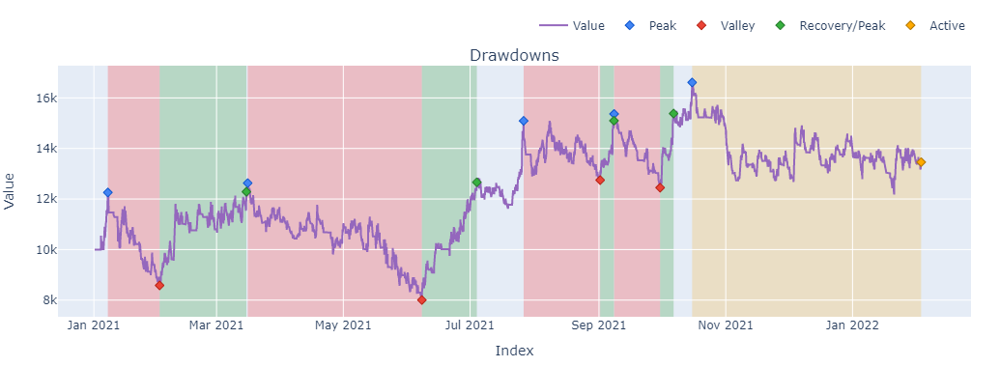

In [12]:
default_strategy_sl(btc, multiply = 3.9).plot(subplots=['drawdowns']).show() # Equity Curve

--------------------------------------------------

In [13]:
def run_strategy_sl_fixRPT(df, timeframe = '1h', cash = 10000, multiply =1.4, riskpertrade = 0.01):
    e1 = df.ta.ema(12)
    e2 = df.ta.ema(26)
    ckpl = df.ta.cksp()['CKSPl_10_3_20']
    ckps = df.ta.cksp()['CKSPs_10_3_20']
    
    l1 = (e1 > e2) & (e1.shift(1) < e2) 
    l2 = (df.Close > e1)
    df['long_signal'] = l1 & l2

    s1 = (e1 < e2) & (e1.shift(1) > e2)
    s2 = (df.Close < e1)
    df['short_signal'] = s1 & s2 

    df['long_exit'] =  (df.Close < ckpl)
    df['short_exit'] =  (df.Close > ckpl)

    
    df['vol'] = df.ta.stdev().ewm(alpha=0.96).mean()
    df['sl_stop'] = (df['vol'] * multiply) / df.Close
    df['size'] = ((riskpertrade * cash)/df['sl_stop'])/ df.Close
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = df['long_signal'],
                                    exits = df['long_exit'] ,
                                    short_entries = df['short_signal'],
                                    short_exits = df['short_exit'],
                                    freq = timeframe,
                                    init_cash = cash, size = df['size'],
                                    fees = 0.00, sl_stop = df['sl_stop'],
                                    slippage = 0.00)
    return port

##### Strategy with Volatility SL (Fix Risk per trade)

In [14]:
#if reach stoploss price it will loss 1% of cash 
def default_strategy_sl_fixRPT(df, timeframe = '1h', cash = 10000, multiply = 1.4, riskpertrade = 0.01):
    e1 = df.ta.ema(12)
    e2 = df.ta.ema(26)

    l1 = (e1 > e2) & (e1.shift(1) < e2)
    l2 = (df.Close > e1)
    long_signal = l1 & l2

    s1 = (e1 < e2) & (e1.shift(1) > e2)
    s2 = (df.Close < e1)
    short_signal = s1 & s2

    long_exit = df.Close < e2
    short_exit = df.Close > e2

    #add to Empty Dataframe
    LongEntries = long_signal
    LongExit= long_exit    
    ShortEntries= short_signal
    ShortExit= short_exit
    
    df['atr'] = df.ta.atr()
    df['sl_stop'] = (df['atr'] * multiply) / df.Close
    df['size'] = ((riskpertrade * cash)/df['sl_stop'])/ df.Close
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = LongEntries,
                                    exits = LongExit,
                                    short_entries = ShortEntries,
                                    short_exits = ShortExit,
                                    freq = timeframe,
                                    init_cash = cash, size = df['size'],
                                    fees = 0.00, sl_stop = df['sl_stop'],
                                    slippage = 0.00)
    return port

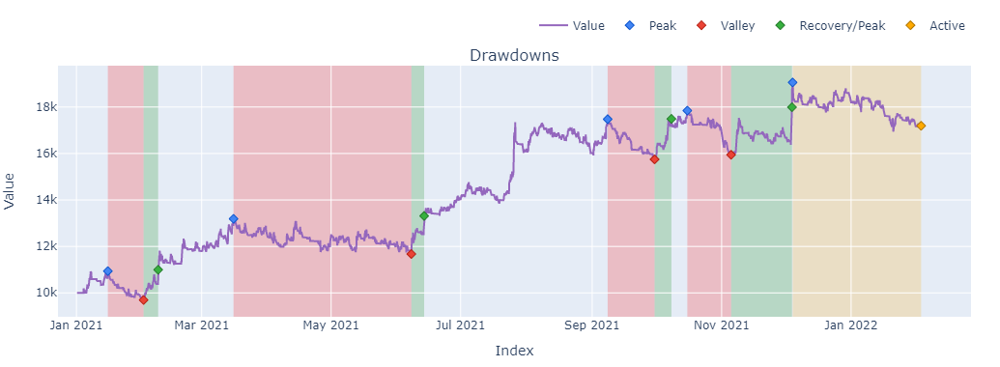

In [15]:
run_strategy_sl_fixRPT(btc,multiply = 1.4).plot(subplots=['drawdowns']).show() # Equity Curve

In [18]:
def _fixRPT(df, timeframe = '1h', cash = 10000, multiply =1.4, riskpertrade = 0.01):
    e1 = df.ta.wma(12)
    e2 = df.ta.wma(26)
    ckpl = df.ta.cksp()['CKSPl_10_3_20']
    ckps = df.ta.cksp()['CKSPs_10_3_20']
    
    l1 = (e1 > e2) & (e1.shift(1) < e2) 
    l2 = (df.Close > e1)
    df['long_signal'] = l1 #& l2

    s1 = (e1 < e2) & (e1.shift(1) > e2)
    s2 = (df.Close < e1)
    df['short_signal'] = s1 #& s2 

    df['long_exit'] =  (df.Close < ckpl) |(e1 < e2)
    df['short_exit'] =  (df.Close > ckpl) | (e1 > e2)

    
    df['vol'] = df.ta.stdev().ewm(alpha=0.96).mean()
    df['sl_stop'] = (df['vol'] * multiply) / df.Close
    df['size'] = ((riskpertrade * cash)/df['sl_stop'])/ df.Close
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = df['long_signal'],
                                    exits = df['long_exit'] ,
                                    short_entries = df['short_signal'],
                                    short_exits = df['short_exit'],
                                    freq = timeframe,
                                    init_cash = cash, size = df['size'],
                                    fees = 0.00, sl_stop = df['sl_stop'],
                                    slippage = 0.00)
    return port

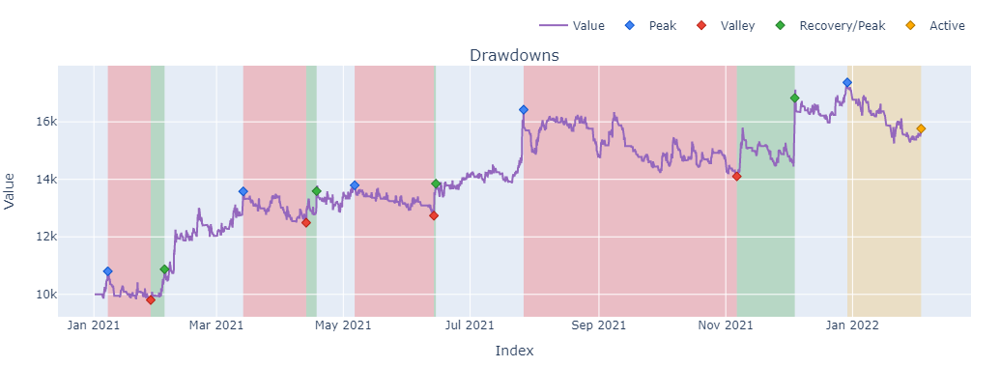

In [19]:
_fixRPT(btc,multiply = 1.4).plot(subplots=['drawdowns']).show() # Equity Curve

### Strategy test with Trend Period

##### Trend Data 1

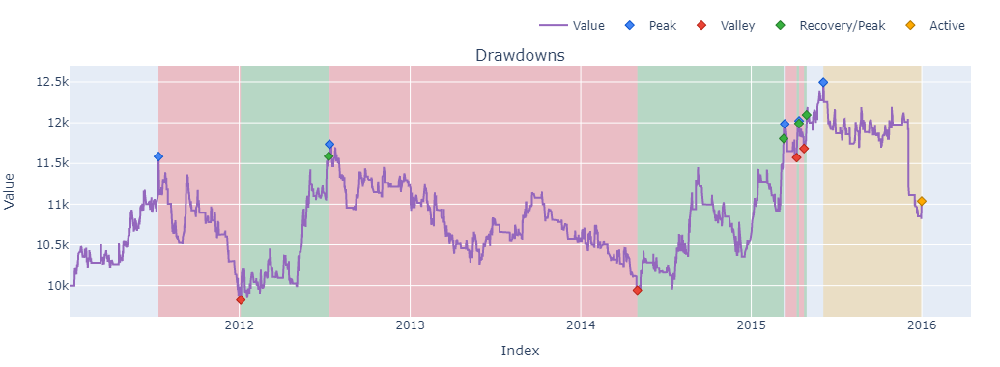

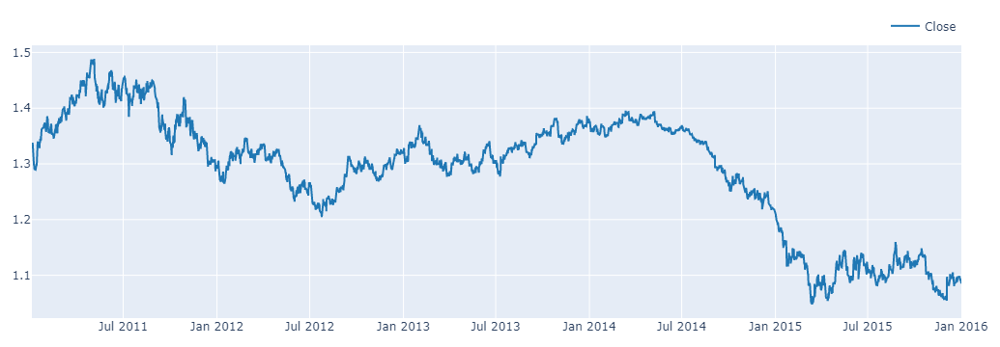

In [20]:
default_strategy_sl_fixRPT(dftr1).plot(subplots=['drawdowns']).show() # Equity Curve
dftr1.Close.vbt.plot().show() #Price

#####  Trend Data 2

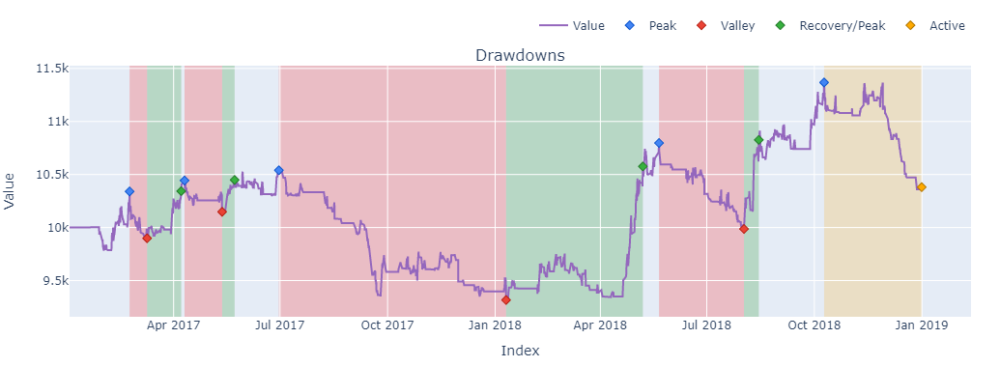

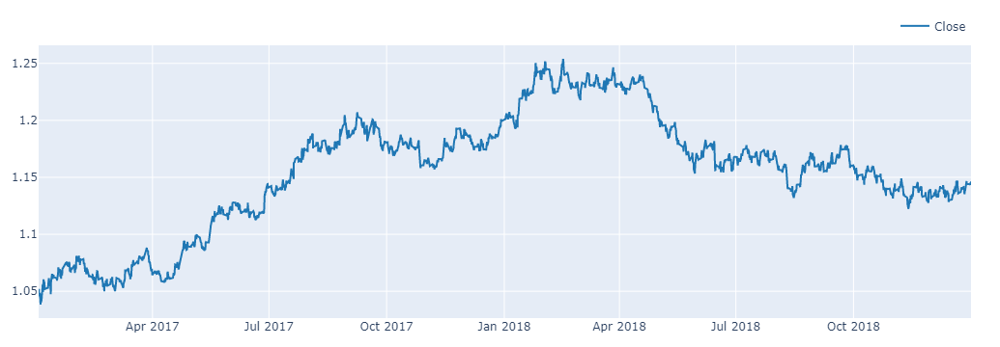

In [21]:
default_strategy_sl_fixRPT(dftr2).plot(subplots=['drawdowns']).show() # Equity Curve
dftr2.Close.vbt.plot().show() #Price

### Strategy test with non-Trend Period

#####  Non-Trend Data 1

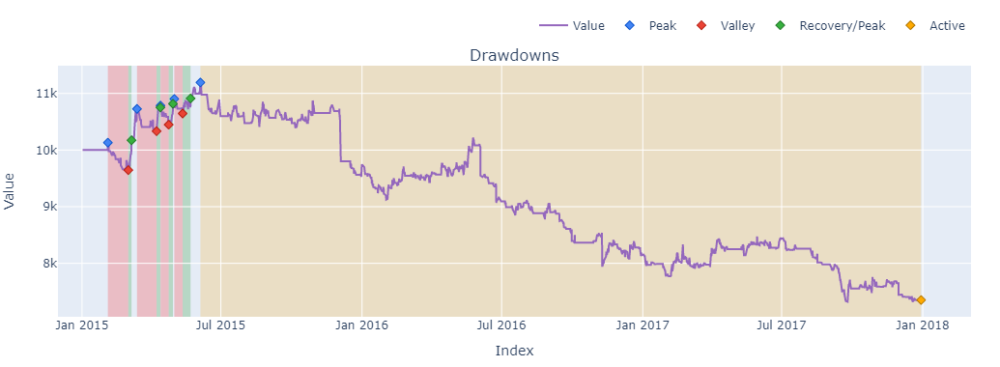

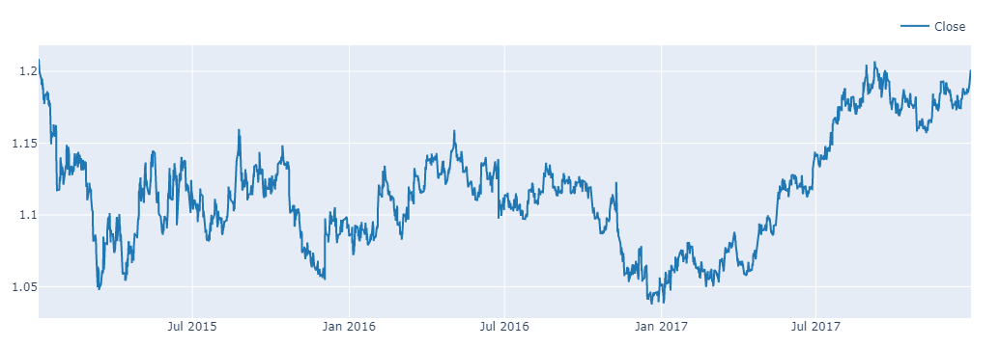

In [22]:
default_strategy_sl_fixRPT(dfsw1).plot(subplots=['drawdowns']).show() # Equity Curve
dfsw1.Close.vbt.plot().show() #Price

#####  Non-Trend Data 2

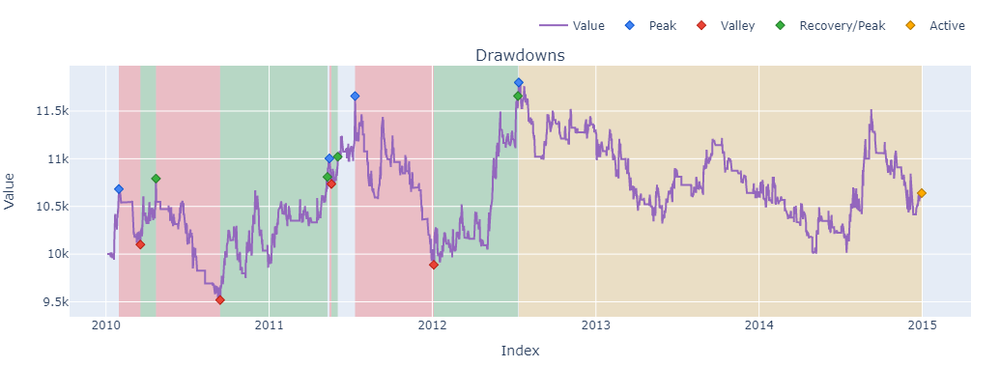

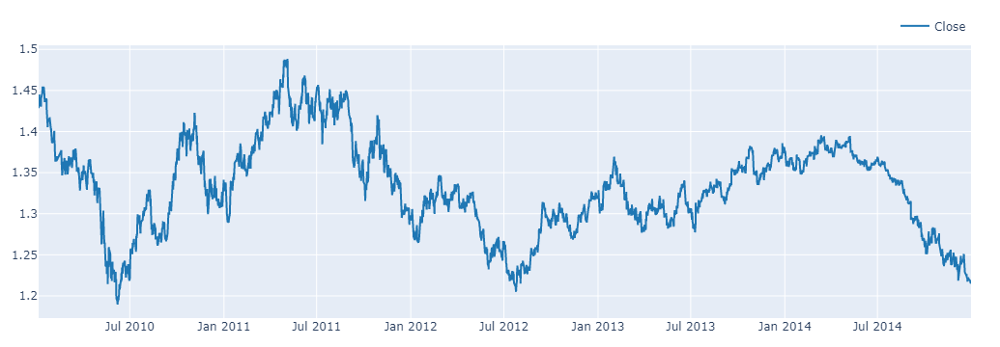

In [23]:
default_strategy_sl_fixRPT(dfsw2).plot(subplots=['drawdowns']).show() # Equity Curve
dfsw2.Close.vbt.plot().show() #Price